# gprMax forward modelling results
In this notebook you can:
- Visualise the forward modelling results as snapshots for:
    - The baseline model
    - The timelapsed model
- Calculate the difference between the two wavefields and visualise as snapshots

In [72]:
import os
import glob
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.patches as patches
import h5py
import pyvista as pv

matplotlib.rcParams.update({"figure.dpi": 100})

# ── File paths & run configuration ───────────────────────────────────────────
NOTEBOOK_DIR  = os.path.dirname(os.path.abspath("__file__"))
file_prefix   = ""     # matches file_prefix in inputfile_generator; "" = default names
output_subdir = "Experiment_2"     # "run_01" -> outputs/run_01/;  "" = same dir as .in files

out_dir = (
    os.path.join(NOTEBOOK_DIR, output_subdir)
    if output_subdir else NOTEBOOK_DIR
)

def _stem(suffix):
    return f"{file_prefix}_{suffix}" if file_prefix else suffix

BASELINE_OUT  = os.path.join(out_dir, _stem("baseline")  + ".out")
TIMELAPSE_OUT = os.path.join(out_dir, _stem("timelapse") + ".out")

BASELINE_SNAPS_DIR  = os.path.join(out_dir, _stem("baseline")  + "_snaps")
TIMELAPSE_SNAPS_DIR = os.path.join(out_dir, _stem("timelapse") + "_snaps")

# ── Geometry (must match inputfile_generator Cell 1) ─────────────────────────
c_light      = 3e8           # [m/s]
eps_ice      = 3.15
f_central    = 1.5e9         # [Hz]
domain_width = 4.0           # [m]
air_thickness  = 0.1         # [m]
fracture_depth = 0.6         # [m]

tx_x       = domain_width / 2
rx_count   = 100
rx_spread  = 2.0
rx_min_x   = tx_x - rx_spread / 2
rx_dx      = rx_spread / max(1, rx_count - 1)
rx_positions = np.array([rx_min_x + i * rx_dx for i in range(rx_count)])

c_ice = c_light / np.sqrt(eps_ice)

# ── Difference display controls ───────────────────────────────────────────────
DIFF_GAIN    = 20.0   # multiply residual by this to reveal subwavelength scattering
SNAP_INDICES = None   # None = load all;  e.g. [5, 10, 15, 20, 25] for a subset
snap_interval = 0.5e-9  # [s] must match snap_interval in inputfile_generator Cell 1

print(f"Baseline  .out : {BASELINE_OUT}")
print(f"Timelapse .out : {TIMELAPSE_OUT}")
print(f"Snaps (B)      : {BASELINE_SNAPS_DIR}")
print(f"Snaps (TL)     : {TIMELAPSE_SNAPS_DIR}")

Baseline  .out : c:\Users\Administrator\OneDrive\Thesis\TimeLapse_Notebooks\Experiment_2\baseline.out
Timelapse .out : c:\Users\Administrator\OneDrive\Thesis\TimeLapse_Notebooks\Experiment_2\timelapse.out
Snaps (B)      : c:\Users\Administrator\OneDrive\Thesis\TimeLapse_Notebooks\Experiment_2\baseline_snaps
Snaps (TL)     : c:\Users\Administrator\OneDrive\Thesis\TimeLapse_Notebooks\Experiment_2\timelapse_snaps


In [73]:
# ── .out HDF5 loader ─────────────────────────────────────────────────────────
def load_out(path):
    """Load gprMax .out (HDF5) file.
    Returns: traces (n_rx, n_time), time_s (n_time,), dt_s."""
    with h5py.File(path, "r") as f:
        dt    = float(f.attrs["dt"])
        iters = int(f.attrs["Iterations"])
        time  = np.arange(iters) * dt

        grp  = f["rxs"] if "rxs" in f else f
        keys = sorted(
            [k for k in grp.keys() if k.startswith("rx") and k != "rxs"],
            key=lambda k: int(k[2:]),
        )
        traces = []
        for key in keys:
            item = grp[key]
            ez   = np.array(item["Ez"] if isinstance(item, h5py.Group) else item)
            if ez.ndim > 1:
                ez = ez[0]
            traces.append(ez)
    return np.array(traces), time, dt


# ── .vti snapshot loader ─────────────────────────────────────────────────────
def load_snapshots(snaps_dir, snap_prefix, indices=None):
    """Load Ez wavefield from .vti snapshot files.
    Returns sorted list of (snap_index, 2D Ez array (ny, nx))."""
    pattern = os.path.join(snaps_dir, f"{snap_prefix}*.vti")
    files   = glob.glob(pattern)
    results = []
    for fpath in files:
        base = os.path.basename(fpath)
        try:
            idx = int(base[len(snap_prefix):-4])
        except ValueError:
            continue
        if indices is not None and idx not in indices:
            continue
        mesh = pv.read(fpath)
        dims = mesh.dimensions
        data = mesh["E-field"]
        Ez   = data[:, 2] if (data.ndim == 2 and data.shape[1] == 3) else data.flatten()
        results.append((idx, Ez.reshape(dims[1] - 1, dims[0] - 1)))
    results.sort(key=lambda x: x[0])  # numeric sort by snapshot index
    return results


# ── Load trace data ───────────────────────────────────────────────────────────
print("Loading .out files ...")
baseline_traces,  time, dt = load_out(BASELINE_OUT)
timelapse_traces, _,    _  = load_out(TIMELAPSE_OUT)
time_ns = time * 1e9

assert baseline_traces.shape == timelapse_traces.shape, (
    f"Shape mismatch: {baseline_traces.shape} vs {timelapse_traces.shape}"
)
print(f"  Shape  : {baseline_traces.shape}  (n_rx x n_time)")
print(f"  Time   : 0 to {time_ns[-1]:.3f} ns  |  dt = {dt * 1e12:.2f} ps")

# ── Load snapshots ────────────────────────────────────────────────────────────
snap_pref_b  = _stem("baseline")  + "_"
snap_pref_tl = _stem("timelapse") + "_"

print("Loading snapshots ...")
snaps_b  = load_snapshots(BASELINE_SNAPS_DIR,  snap_pref_b,  SNAP_INDICES)
snaps_tl = load_snapshots(TIMELAPSE_SNAPS_DIR, snap_pref_tl, SNAP_INDICES)

if snaps_b:
    t0 = snaps_b[0][0]  * snap_interval * 1e9
    t1 = snaps_b[-1][0] * snap_interval * 1e9
    print(f"  Baseline  : {len(snaps_b)} snapshots  (t = {t0:.2f} to {t1:.2f} ns)")
else:
    print("  No baseline snapshots found (run with enable_snapshots=True in inputfile_generator)")
if snaps_tl:
    print(f"  Timelapse : {len(snaps_tl)} snapshots")

Loading .out files ...
  Shape  : (100, 8000)  (n_rx x n_time)
  Time   : 0 to 14.063 ns  |  dt = 1.76 ps
Loading snapshots ...
  Baseline  : 28 snapshots  (t = 0.50 to 14.00 ns)
  Timelapse : 28 snapshots


In [74]:
# ── B-scan (time-vs-offset heatmap) ──────────────────────────────────────────
def plot_bscan(traces, time_ns, rx_pos, title):
    """Seismic colormap B-scan. Color limits auto-set per call (independent for diff)."""
    vlim = np.percentile(np.abs(traces), 99)
    if vlim == 0:
        vlim = 1.0

    fig, ax = plt.subplots(figsize=(12, 7))
    im = ax.imshow(
        traces.T,
        aspect="auto",
        cmap="seismic",
        origin="upper",
        extent=[rx_pos[0], rx_pos[-1], time_ns[-1], time_ns[0]],
        vmin=-vlim,
        vmax=vlim,
    )

    t_frac_ns = fracture_depth / c_ice * 2.0 * 1e9
    ax.axhline(t_frac_ns, color="lime", linestyle="--", linewidth=1.2,
               label=f"Fracture TWTT ({t_frac_ns:.2f} ns)")

    ax.set_title(title, fontsize=14, weight="bold")
    ax.set_xlabel("Offset (m)", fontsize=12)
    ax.set_ylabel("Two-way travel time (ns)", fontsize=12)
    ax.yaxis.set_minor_locator(ticker.MultipleLocator(0.5))
    ax.tick_params(axis="y", which="minor", length=4)
    ax.legend(loc="upper right", fontsize=9)

    cbar = fig.colorbar(im, ax=ax, pad=0.02)
    cbar.set_label("Ez (V/m)", fontsize=10)
    plt.tight_layout()
    return fig


# ── Wiggle / Common-Shot Gather ───────────────────────────────────────────────
def plot_wiggle(traces, time_ns, rx_pos, title):
    """Wiggle traces (Common Shot Gather). Each trace centered on its rx x-position."""
    rx_sp    = rx_pos[1] - rx_pos[0] if len(rx_pos) > 1 else 0.05
    max_val  = np.max(np.abs(traces))
    if max_val == 0:
        max_val = 1.0
    scale = (rx_sp * 0.8) / max_val

    fig, ax = plt.subplots(figsize=(10, 7))
    for i, trace in enumerate(traces):
        x_base = rx_pos[i]
        scaled = x_base + trace * scale
        ax.plot(scaled, time_ns, "k-", linewidth=0.5)
        ax.fill_betweenx(time_ns, x_base, scaled,
                         where=(scaled > x_base), facecolor="k", alpha=0.5)
        ax.axvline(x_base, color="k", linestyle=":", linewidth=0.3, alpha=0.2)

    t_frac_ns = fracture_depth / c_ice * 2.0 * 1e9
    ax.axhline(t_frac_ns, color="lime", linestyle="--", linewidth=1.2,
               label=f"Fracture TWTT ({t_frac_ns:.2f} ns)")

    ax.set_ylim(time_ns[-1], time_ns[0])
    ax.set_xlim(rx_pos[0] - rx_sp, rx_pos[-1] + rx_sp)
    ax.set_title(title, fontsize=14, weight="bold")
    ax.set_xlabel("Offset (m)", fontsize=12)
    ax.set_ylabel("Two-way travel time (ns)", fontsize=12)
    ax.yaxis.set_minor_locator(ticker.MultipleLocator(0.5))
    ax.tick_params(axis="y", which="minor", length=4)
    ax.legend(loc="upper right", fontsize=9)
    plt.tight_layout()
    return fig


# ── Snapshot wavefield grid ───────────────────────────────────────────────────
def plot_snapshot_grid(snaps, domain_w, domain_h, snap_dt_s, title, is_diff=False):
    """2-column grid of Ez wavefield panels with geology overlays.

    is_diff=True  -> per-panel independent color scale (residual visualization).
    is_diff=False -> staged normalization: early/mid/late (matches do_plot logic).
    """
    if not snaps:
        print(f"No snapshots to plot: {title}")
        return None

    n      = len(snaps)
    ncols  = 2
    nrows  = int(np.ceil(n / ncols))
    fig, axes = plt.subplots(nrows, ncols,
                             figsize=(16, 3.5 * nrows),
                             sharex=True, sharey=True)
    axes = np.array(axes).reshape(-1)

    # ── Staged normalization (mirrors do_plot from plotting.py) ───────────────
    all_abs = [np.abs(d) for _, d in snaps]
    early   = [a for i, a in enumerate(all_abs) if (i / n) <= 0.15]
    mid     = [a for i, a in enumerate(all_abs) if 0.15 < (i / n) <= 0.70]
    late    = [a for i, a in enumerate(all_abs) if (i / n) > 0.70]

    fallback = max(a.max() for a in all_abs) if all_abs else 1.0

    if is_diff:
        global_ref = max((np.percentile(a, 99.5) for a in all_abs), default=fallback)
    else:
        early_max = max((a.max() for a in early), default=fallback)
        mid_pct   = max((np.percentile(a, 99.2) for a in mid),  default=early_max)
        late_pct  = max((np.percentile(a, 99.7) for a in late), default=early_max)
        mid_ref   = float(np.clip(mid_pct,  early_max * 0.035, early_max * 0.22))
        late_ref  = float(np.clip(late_pct, early_max * 0.06,  early_max * 0.32))

    # gprMax y-coordinates (y=0 at bottom, y=domain_h at top)
    y_surface  = domain_h - air_thickness
    y_frac_top = y_surface - fracture_depth

    for i, (idx, data_2d) in enumerate(snaps):
        ax    = axes[i]
        t_ns  = idx * snap_dt_s * 1e9
        frac  = i / n

        if is_diff:
            vlim = np.percentile(np.abs(data_2d), 99.5) if data_2d.any() else global_ref
        else:
            vlim = early_max if frac <= 0.15 else (mid_ref if frac <= 0.70 else late_ref)
        if vlim == 0:
            vlim = fallback

        im = ax.imshow(
            data_2d,
            aspect="auto",
            cmap="seismic",
            origin="lower",
            extent=[0, domain_w, 0, domain_h],
            vmin=-vlim,
            vmax=vlim,
        )

        # Air layer (light blue patch)
        ax.add_patch(patches.Rectangle(
            (0, y_surface), domain_w, air_thickness,
            facecolor="#cfe8ff", edgecolor="none", alpha=0.30, zorder=3))
        # Ice surface line
        ax.axhline(y_surface,  color="navy", linewidth=0.8, alpha=0.6, zorder=4)
        # Fracture depth annotation
        ax.axhline(y_frac_top, color="red",  linewidth=0.8,
                   linestyle="--", alpha=0.5, zorder=4)

        # Tx / Rx markers
        ax.plot(tx_x, y_surface, "r*", markersize=7, zorder=5,
                label="Tx" if i == 0 else "")
        if i == 0:
            ax.scatter(rx_positions, np.full(len(rx_positions), y_surface),
                       marker="v", s=10, color="green", zorder=5, label="Rx")

        ax.set_title(f"t = {t_ns:.2f} ns", fontsize=10, weight="bold")
        ax.set_xlabel("Length (m)", fontsize=9)
        ax.set_ylabel("Depth (m)",  fontsize=9)

        if i == 0:
            ax.legend(loc="lower right", fontsize=8, ncol=2)

        cbar = fig.colorbar(im, ax=ax, fraction=0.035, pad=0.02)
        cbar.set_label("Ez (V/m)", fontsize=8)
        cbar.ax.tick_params(labelsize=7)

    for j in range(n, len(axes)):
        axes[j].axis("off")

    fig.suptitle(title, fontsize=14, weight="bold")
    fig.tight_layout(rect=[0, 0, 1, 0.97])
    return fig

max|baseline|  = 3.176e+03
max|diff|      = 7.658e+02  (ratio 2.41e-01)
Display gain   = x20.0  =>  displayed max = 1.532e+04

=== B-scans ===


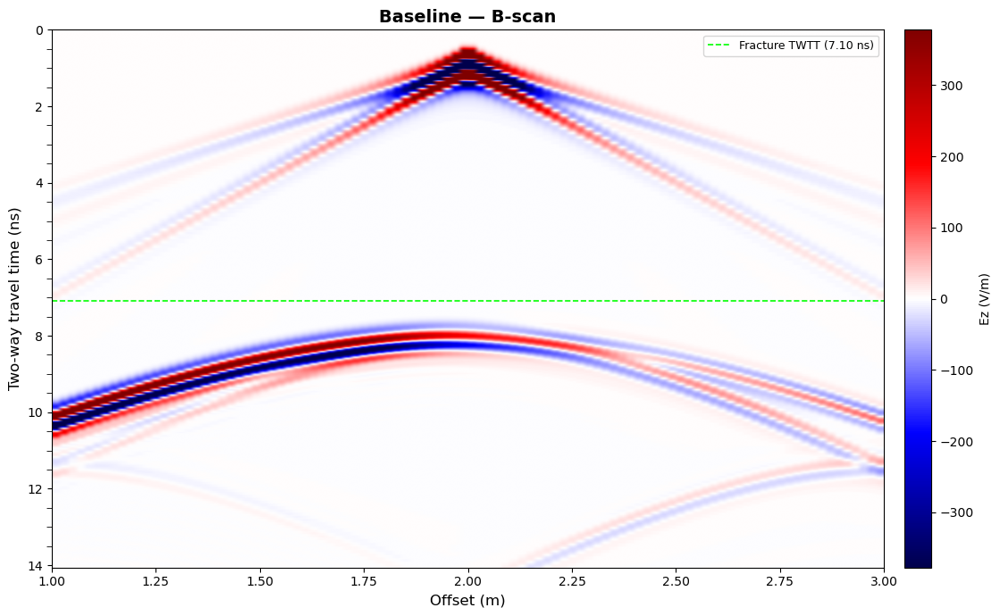

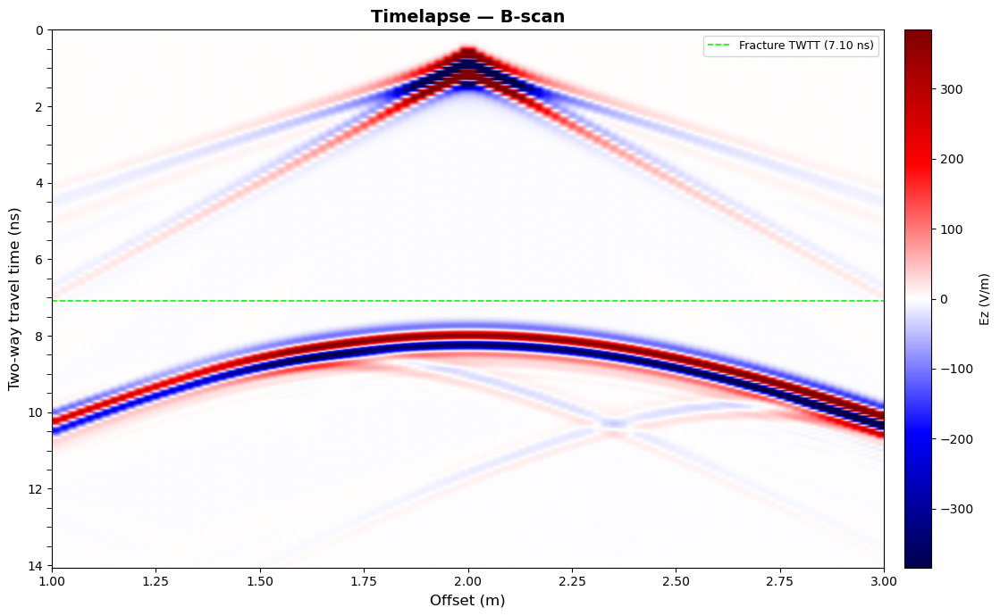

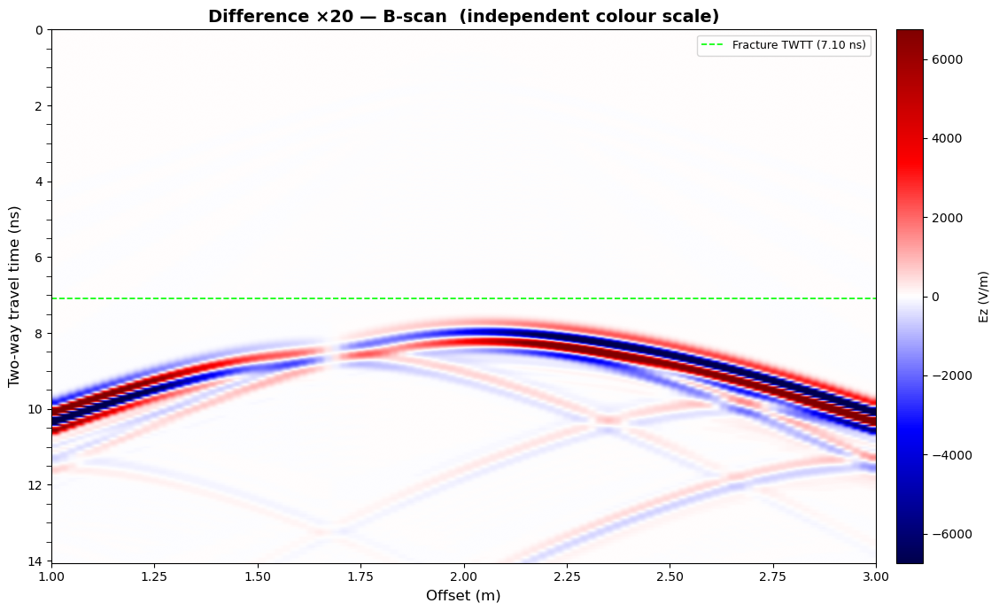


=== Wiggle plots ===


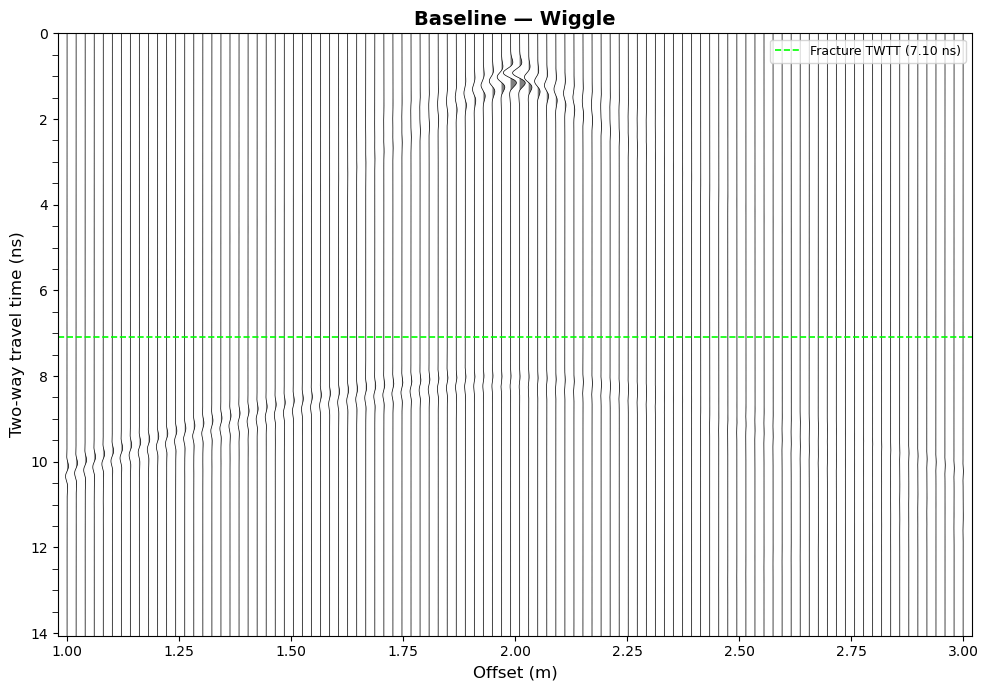

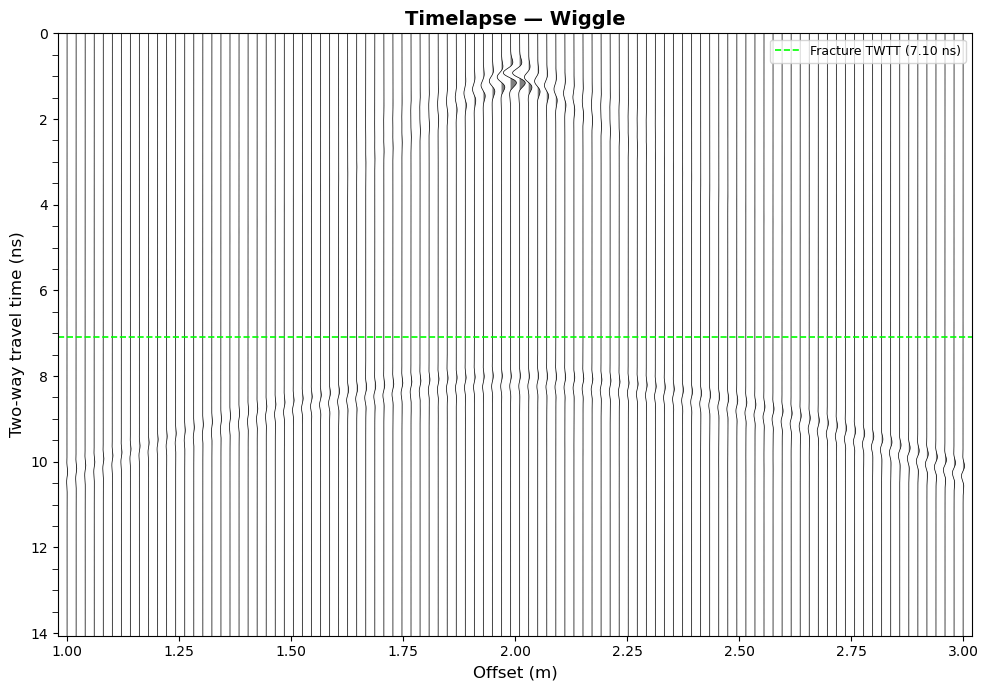

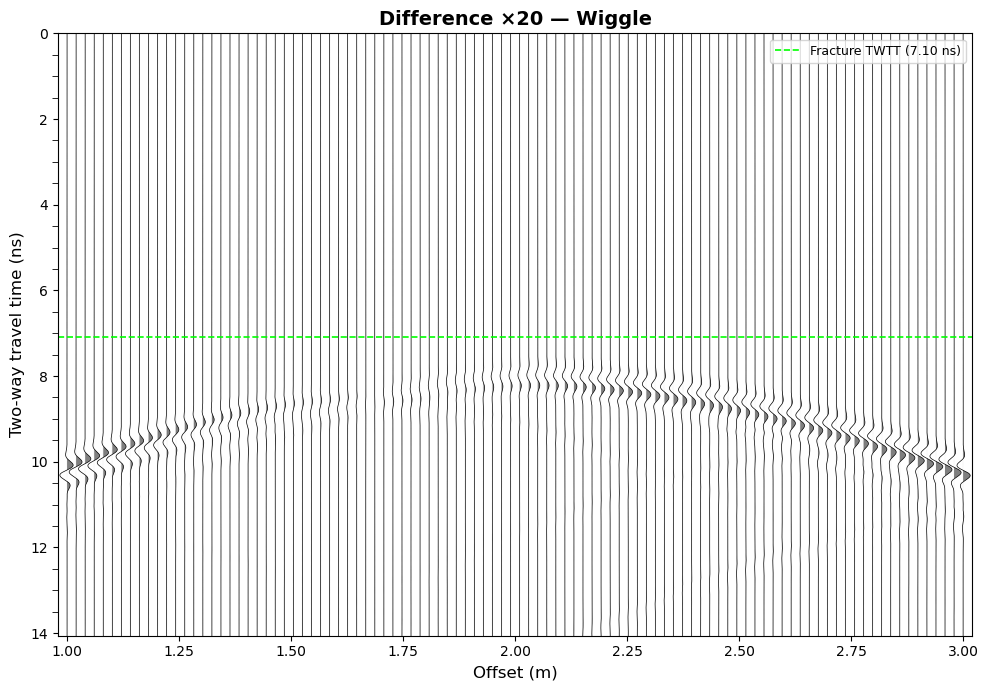


=== Wavefield snapshots ===


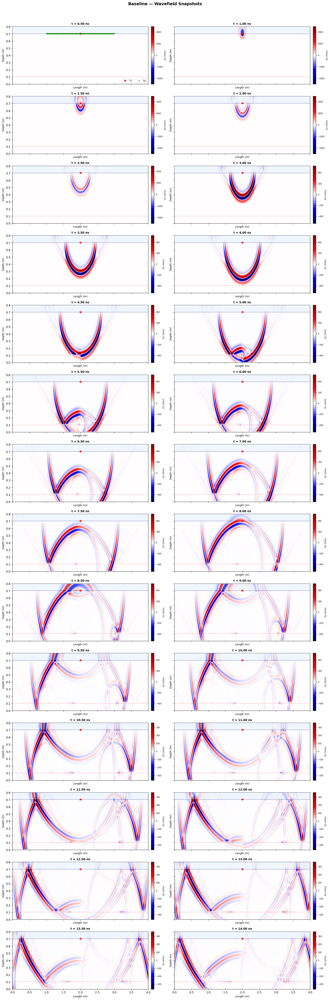

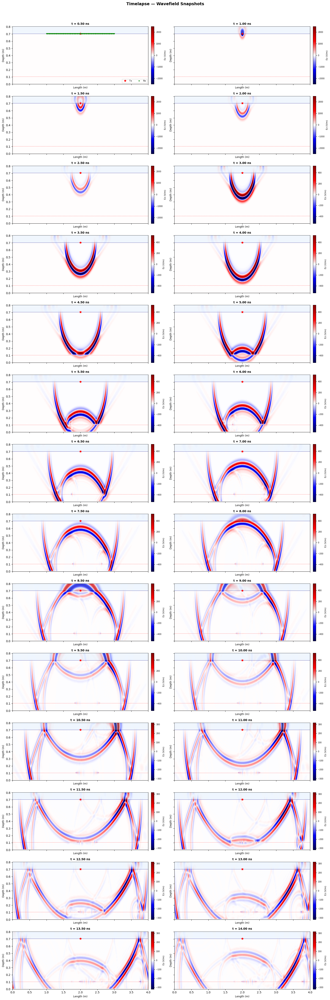

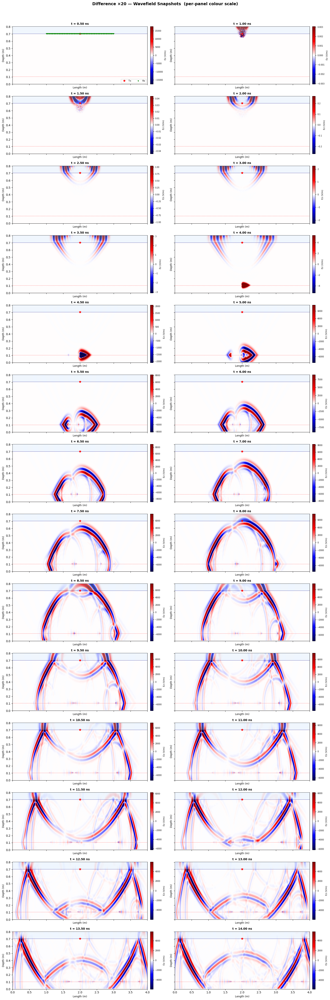

In [75]:
# ── Difference traces ─────────────────────────────────────────────────────────
diff_traces         = baseline_traces - timelapse_traces
diff_traces_display = diff_traces * DIFF_GAIN

ratio = np.max(np.abs(diff_traces)) / (np.max(np.abs(baseline_traces)) + 1e-30)
print(f"max|baseline|  = {np.max(np.abs(baseline_traces)):.3e}")
print(f"max|diff|      = {np.max(np.abs(diff_traces)):.3e}  (ratio {ratio:.2e})")
print(f"Display gain   = x{DIFF_GAIN}  =>  displayed max = {np.max(np.abs(diff_traces_display)):.3e}")

# ── Difference snapshots ──────────────────────────────────────────────────────
if snaps_b and snaps_tl:
    snap_pairs = [
        (idx_b, d_b - d_tl)
        for (idx_b, d_b), (idx_tl, d_tl) in zip(snaps_b, snaps_tl)
        if idx_b == idx_tl
    ]
    if len(snap_pairs) < len(snaps_b):
        print(f"Warning: {len(snaps_b) - len(snap_pairs)} snapshot indices did not align "
              f"-- verify snap_interval matches inputfile_generator.")
    snaps_diff_display = [(idx, data * DIFF_GAIN) for idx, data in snap_pairs]
else:
    snap_pairs = []
    snaps_diff_display = []

# Domain height derived from snapshot shape
if snaps_b:
    _, _s = snaps_b[0]
    snap_domain_h = _s.shape[0] / _s.shape[1] * domain_width
else:
    snap_domain_h = air_thickness + fracture_depth + 0.2

# ─────────────────────────────────────────────────────────────────────────────
# 1. B-scan (time-vs-offset heatmap)
# ─────────────────────────────────────────────────────────────────────────────
print("\n=== B-scans ===")
fig_b1 = plot_bscan(baseline_traces,     time_ns, rx_positions, "Baseline \u2014 B-scan")
plt.show()

fig_b2 = plot_bscan(timelapse_traces,    time_ns, rx_positions, "Timelapse \u2014 B-scan")
plt.show()

fig_b3 = plot_bscan(diff_traces_display, time_ns, rx_positions,
                    f"Difference \u00d7{DIFF_GAIN:.0f} \u2014 B-scan  (independent colour scale)")
plt.show()

# ─────────────────────────────────────────────────────────────────────────────
# 2. Wiggle / Common-Shot Gather
# ─────────────────────────────────────────────────────────────────────────────
print("\n=== Wiggle plots ===")
fig_w1 = plot_wiggle(baseline_traces,     time_ns, rx_positions, "Baseline \u2014 Wiggle")
plt.show()

fig_w2 = plot_wiggle(timelapse_traces,    time_ns, rx_positions, "Timelapse \u2014 Wiggle")
plt.show()

fig_w3 = plot_wiggle(diff_traces_display, time_ns, rx_positions,
                     f"Difference \u00d7{DIFF_GAIN:.0f} \u2014 Wiggle")
plt.show()

# ─────────────────────────────────────────────────────────────────────────────
# 3. Wavefield snapshot grids
# ─────────────────────────────────────────────────────────────────────────────
if snaps_b or snaps_tl or snaps_diff_display:
    print("\n=== Wavefield snapshots ===")

if snaps_b:
    fig_s1 = plot_snapshot_grid(
        snaps_b, domain_width, snap_domain_h, snap_interval,
        "Baseline \u2014 Wavefield Snapshots")
    plt.show()

if snaps_tl:
    fig_s2 = plot_snapshot_grid(
        snaps_tl, domain_width, snap_domain_h, snap_interval,
        "Timelapse \u2014 Wavefield Snapshots")
    plt.show()

if snaps_diff_display:
    fig_s3 = plot_snapshot_grid(
        snaps_diff_display, domain_width, snap_domain_h, snap_interval,
        f"Difference \u00d7{DIFF_GAIN:.0f} \u2014 Wavefield Snapshots  (per-panel colour scale)",
        is_diff=True)
    plt.show()

Running Kirchhoff PSTM ...
  [1/3] Baseline ...


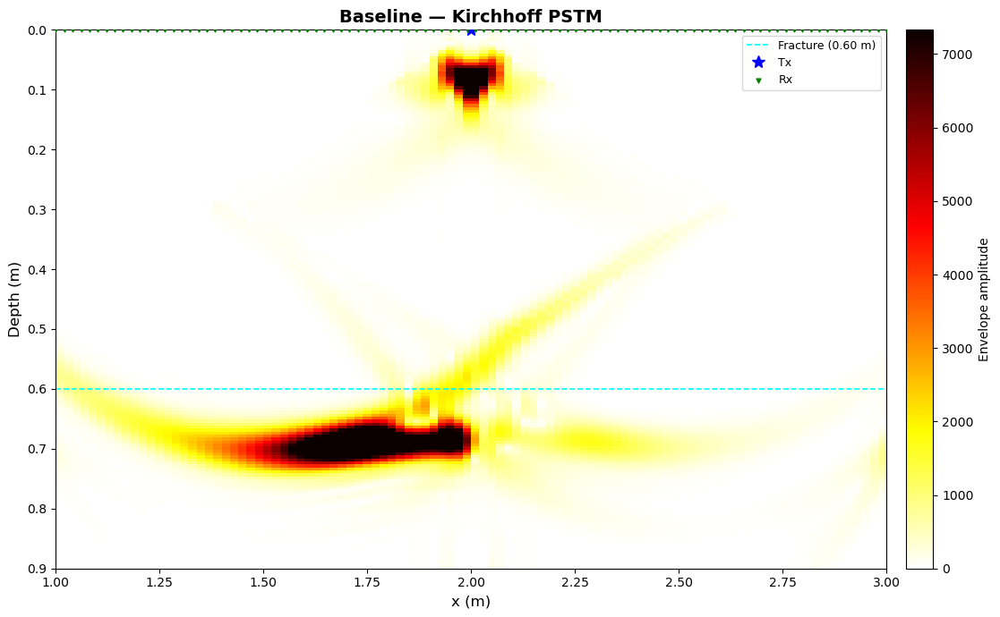

  [2/3] Timelapse ...


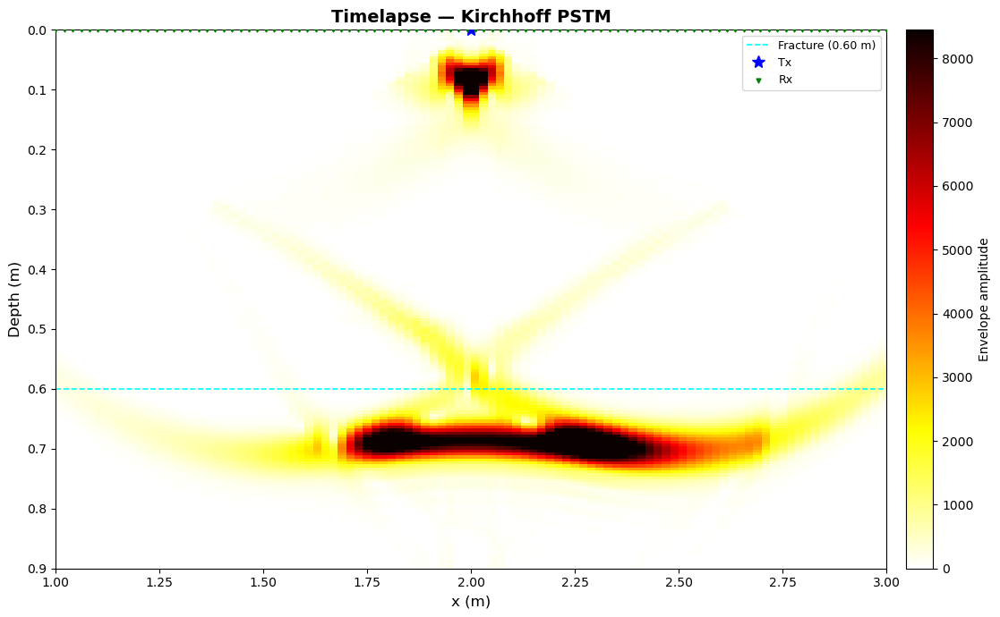

  [3/3] Difference (raw, independent colour scale) ...


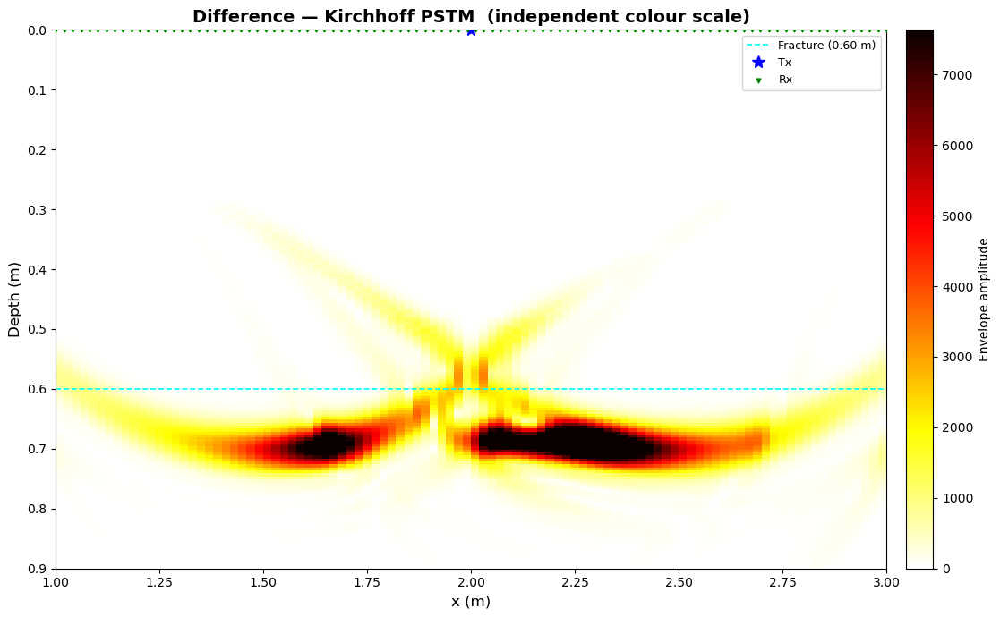

In [80]:
# ── Kirchhoff PSTM ───────────────────────────────────────────────────────────
def kirchhoff_migration(traces, time_ns, rx_x, tx_x, velocity,
                        max_depth, dz=0.005, max_angle_deg=65.0):
    """Constant-velocity Kirchhoff PSTM (adjoint of Operator_PSTM.jl).
    Accepts baseline, timelapse, or difference traces.
    traces   : (n_rx, n_time)  Ez amplitude
    time_ns  : (n_time,)       two-way time [ns]
    rx_x     : (n_rx,)         receiver x-positions [m]
    velocity : float           propagation velocity [m/s]
    Returns  : image (n_depth, n_rx), z_array [m]
    """
    dt_ns   = time_ns[1] - time_ns[0]
    z_array = np.arange(0, max_depth + dz, dz)
    image   = np.zeros((len(z_array), len(rx_x)))
    cos_min = np.cos(np.deg2rad(max_angle_deg))

    for iz, z in enumerate(z_array):
        if z == 0:
            continue
        for ix_out, x_out in enumerate(rx_x):
            d_tx  = np.sqrt((x_out - tx_x)**2 + z**2)
            cos_t = z / d_tx
            if cos_t < cos_min:
                continue
            for irx, rx in enumerate(rx_x):
                d_rx  = np.sqrt((x_out - rx)**2 + z**2)
                cos_r = z / d_rx
                if cos_r < cos_min:
                    continue
                t_ns  = (d_tx + d_rx) / velocity * 1e9
                t_idx = int(np.round((t_ns - time_ns[0]) / dt_ns))
                if 0 <= t_idx < len(time_ns):
                    image[iz, ix_out] += (cos_t + cos_r) * 0.5 * traces[irx, t_idx]
    return image, z_array


def plot_migration_image(image, z_array, rx_x, tx_x, title, fracture_depth=None):
    """Hilbert-envelope migration image. hot_r colormap, depth increases downward."""
    from scipy.signal import hilbert
    env  = np.abs(hilbert(image, axis=0))
    vlim = np.percentile(env, 99)
    if vlim == 0:
        vlim = 1.0

    fig, ax = plt.subplots(figsize=(12, 7))
    im = ax.imshow(
        env,
        aspect="auto",
        cmap="hot_r",
        origin="upper",
        extent=[rx_x[0], rx_x[-1], z_array[-1], z_array[0]],
        vmin=0,
        vmax=vlim,
    )
    if fracture_depth is not None:
        ax.axhline(fracture_depth, color="cyan", linestyle="--", linewidth=1.2,
                   label=f"Fracture ({fracture_depth:.2f} m)")
    ax.plot(tx_x, z_array[0], "b*", markersize=10, zorder=5, label="Tx")
    ax.scatter(rx_x, np.full(len(rx_x), z_array[0]),
               marker="v", s=12, color="green", zorder=5, label="Rx")
    ax.legend(loc="upper right", fontsize=9)
    ax.set_title(title, fontsize=14, weight="bold")
    ax.set_xlabel("x (m)", fontsize=12)
    ax.set_ylabel("Depth (m)", fontsize=12)
    cbar = fig.colorbar(im, ax=ax, pad=0.02)
    cbar.set_label("Envelope amplitude", fontsize=10)
    plt.tight_layout()
    return fig


# ── Migration parameters ──────────────────────────────────────────────────────
MIGRATION_MAX_DEPTH = fracture_depth + 0.3   # image depth [m]
MIGRATION_DZ        = 0.005                   # depth step  [m]  (~lambda_ice / 20)

print("Running Kirchhoff PSTM ...")
print("  [1/3] Baseline ...")
mig_b, z_arr = kirchhoff_migration(
    baseline_traces, time_ns, rx_positions, tx_x, c_ice,
    MIGRATION_MAX_DEPTH, dz=MIGRATION_DZ)
fig_m1 = plot_migration_image(
    mig_b, z_arr, rx_positions, tx_x,
    "Baseline \u2014 Kirchhoff PSTM",
    fracture_depth=fracture_depth)
plt.show()

print("  [2/3] Timelapse ...")
mig_tl, _ = kirchhoff_migration(
    timelapse_traces, time_ns, rx_positions, tx_x, c_ice,
    MIGRATION_MAX_DEPTH, dz=MIGRATION_DZ)
fig_m2 = plot_migration_image(
    mig_tl, z_arr, rx_positions, tx_x,
    "Timelapse \u2014 Kirchhoff PSTM",
    fracture_depth=fracture_depth)
plt.show()

print("  [3/3] Difference (raw, independent colour scale) ...")
mig_diff, _ = kirchhoff_migration(
    diff_traces, time_ns, rx_positions, tx_x, c_ice,
    MIGRATION_MAX_DEPTH, dz=MIGRATION_DZ)
fig_m3 = plot_migration_image(
    mig_diff, z_arr, rx_positions, tx_x,
    "Difference \u2014 Kirchhoff PSTM  (independent colour scale)",
    fracture_depth=fracture_depth)
plt.show()

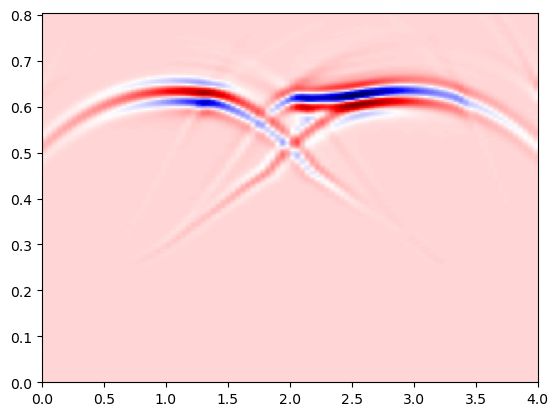

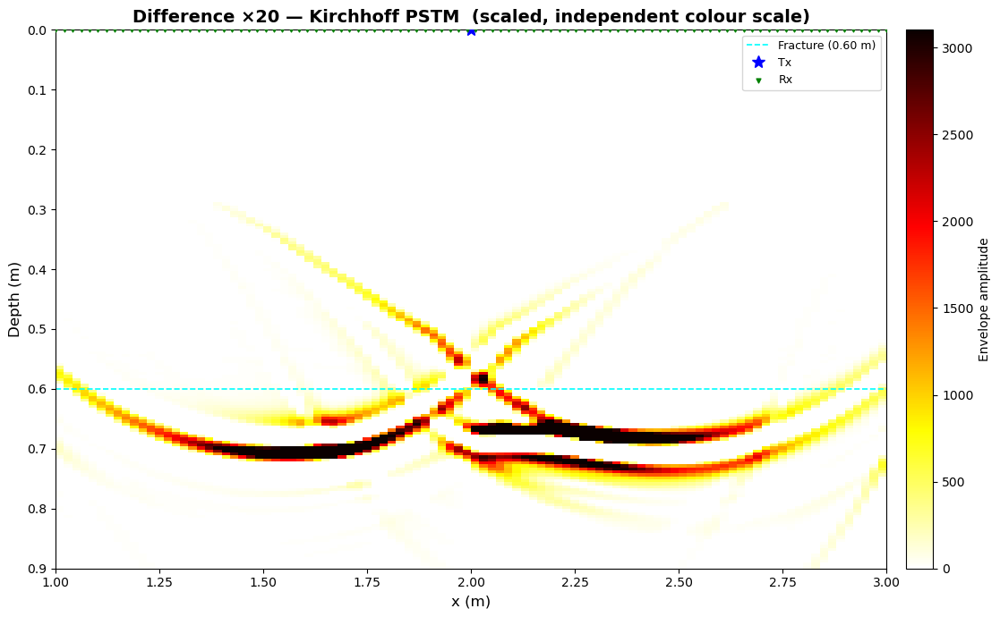

In [79]:
plt.imshow(mig_tl - mig_b, aspect="auto", cmap="seismic", origin="lower", extent=[0, domain_width, 0, snap_domain_h])
fig_m4 = plot_migration_image(
    mig_tl - mig_b, z_arr, rx_positions, tx_x,
    f"Difference \u00d7{DIFF_GAIN:.0f} \u2014 Kirchhoff PSTM  (scaled, independent colour scale)",
    fracture_depth=fracture_depth)